# 1) Check GPU Usage

In [1]:
!nvidia-smi

Fri Jun 27 14:09:54 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   47C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# 2) Import All the Requried Libraries

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.160 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.0/112.6 GB disk)


In [4]:
from ultralytics import YOLO
from IPython.display import Image

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

# 3) Download Dataset from Roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="YOUR_API_KEY")
project = rf.workspace("craters-r51ad").project("workers-safety-equipment-z1mra-nmqhb")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to workers-safety-equipment-1 in yolov11:: 100%|██████████| 2866/2866 [00:00<00:00, 6033.26it/s]


In [12]:
dataset.location

'/content/workers-safety-equipment-1'

(Optional) Delete folder if happens an error and needs to download again

In [9]:
import shutil

folder_path = '/content/workers-safety-equipment-1'  # Replace with the path to your folder

# Delete a non-empty folder
shutil.rmtree(folder_path)
print(f"Folder '{folder_path}' and all its contents have been deleted.")

Folder '/content/workers-safety-equipment-1' and all its contents have been deleted.


# 4) Train YOLO11 Model

In [13]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=50 imgsz=640

100% 5.35M/5.35M [00:00<00:00, 141MB/s]
Ultralytics 8.3.160 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/workers-safety-equipment-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patienc

# 5) Analyze Training Results

### Confusion Matrix

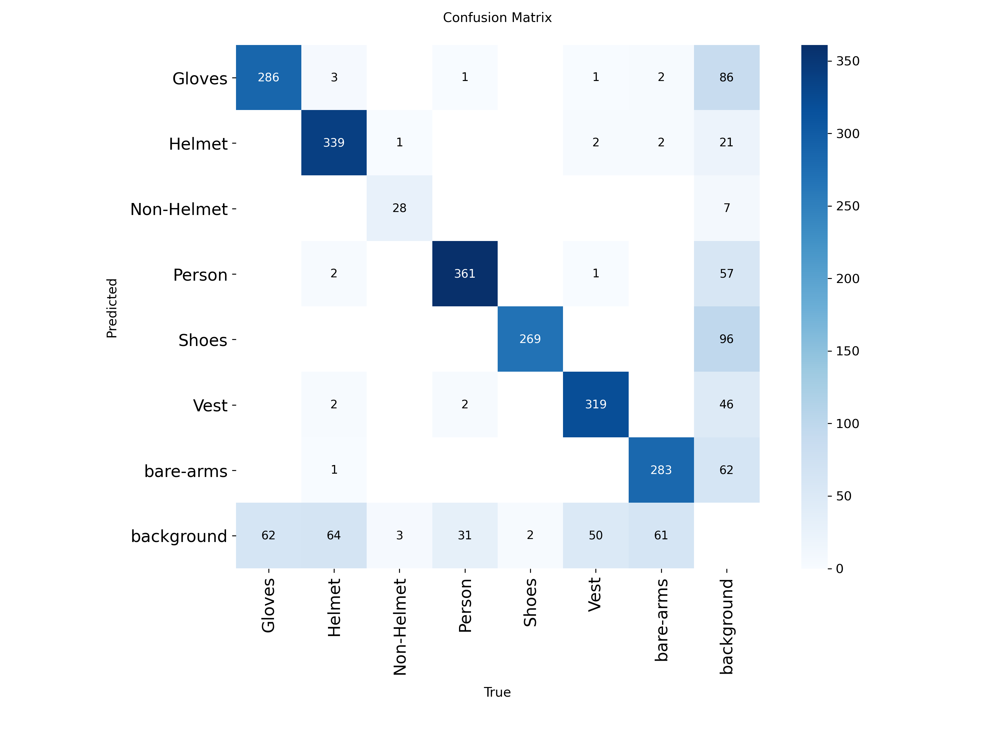

In [14]:
Image("/content/runs/detect/train/confusion_matrix.png", width=600)

### Detection Statistics

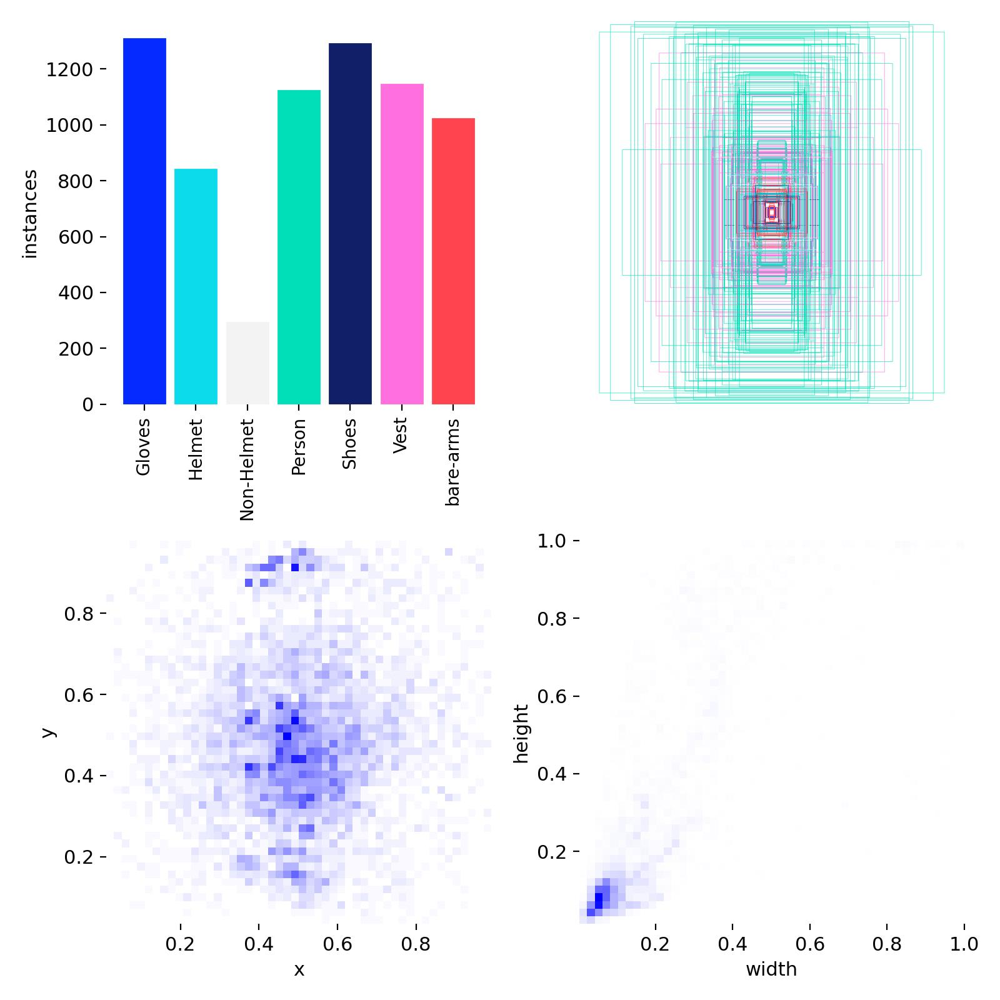

In [15]:
Image("/content/runs/detect/train/labels.jpg", width=600)

### Training Process

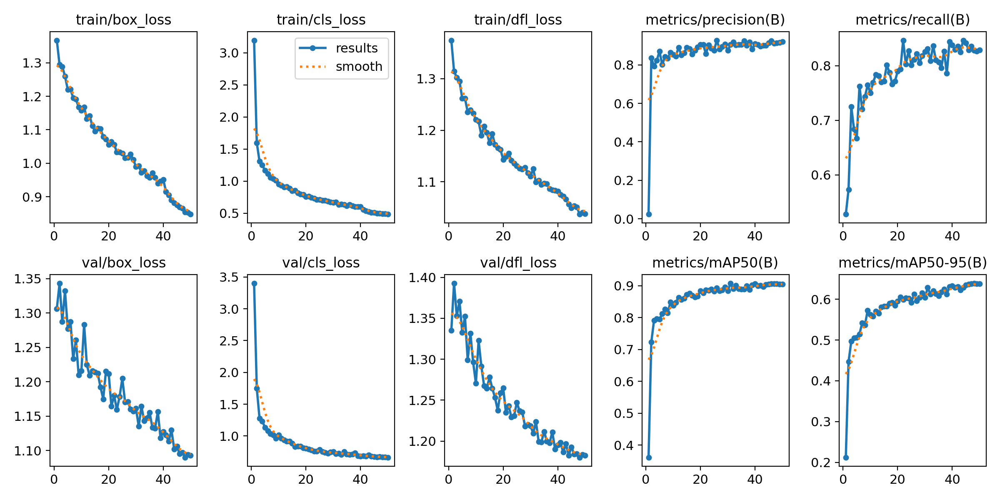

In [16]:
Image("/content/runs/detect/train/results.png", width=600)

### Training Batches and their Training Predictions

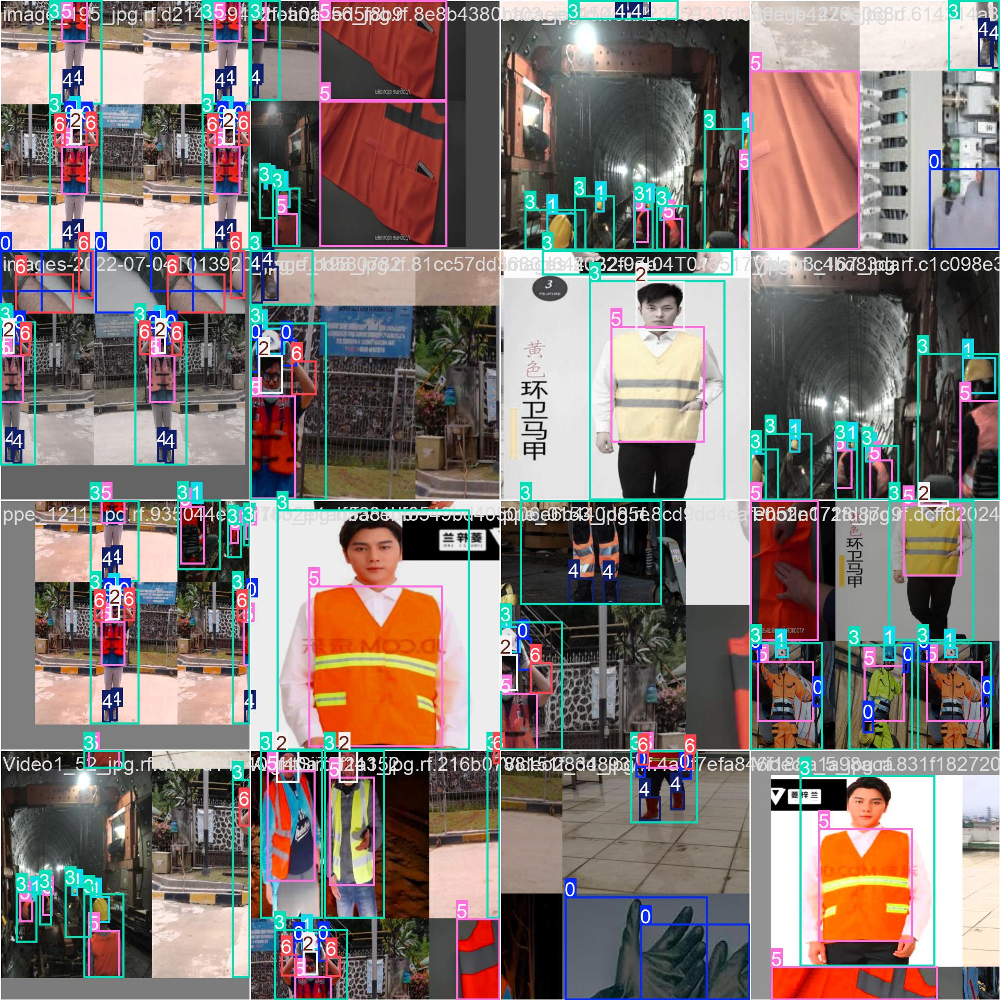

In [17]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

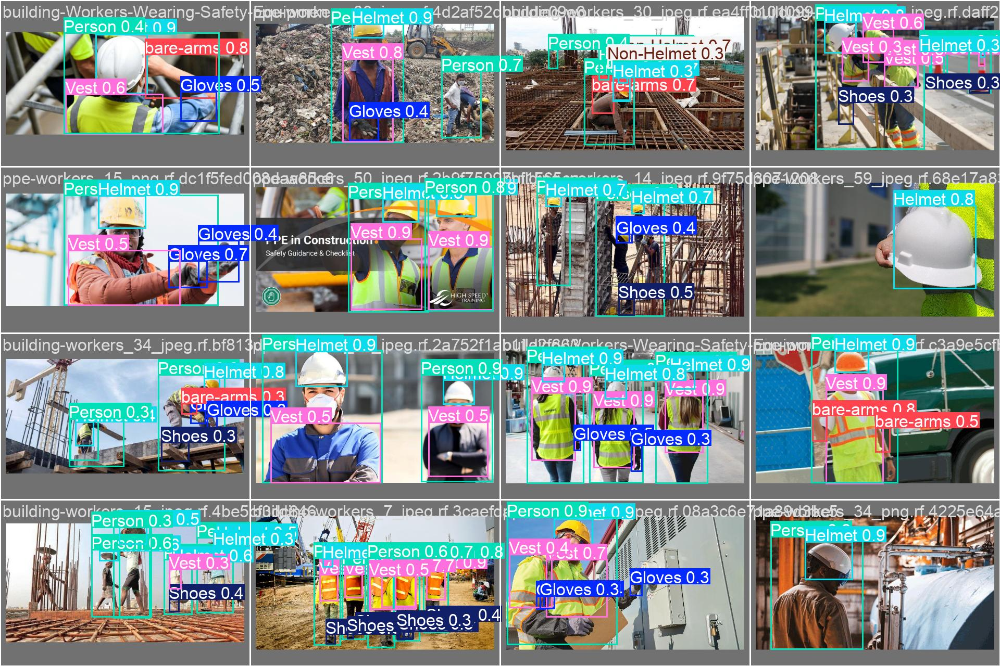

In [18]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

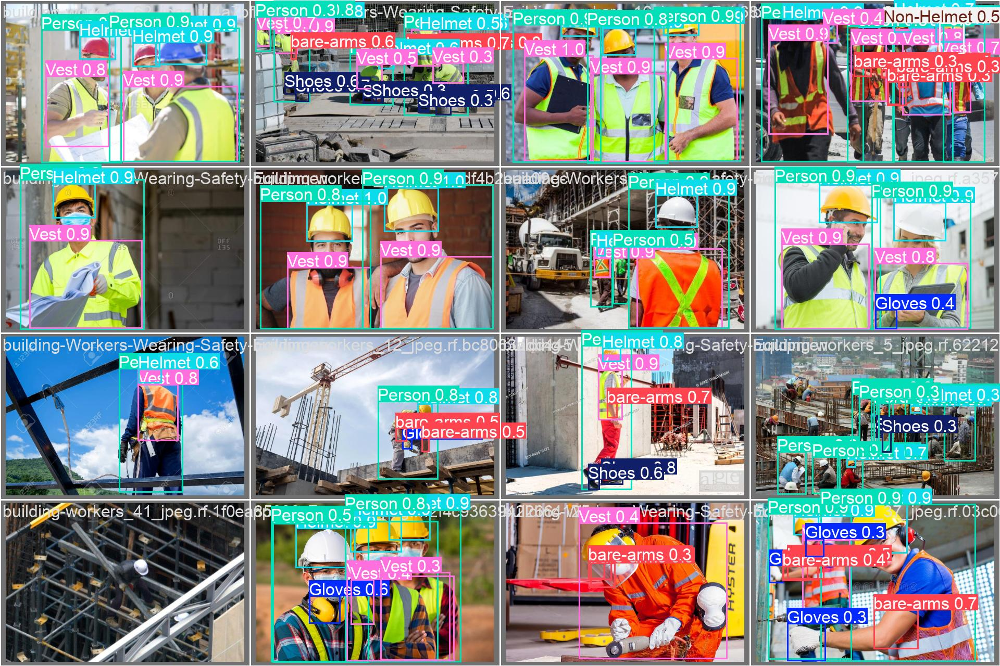

In [19]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=600)

# 6) Model Inference

In [20]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.160 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/142 /content/workers-safety-equipment-1/test/images/00011_jpg.rf.31edabb9f54cb1dcde47f24ee2890e47.jpg: 640x640 1 Helmet, 2 Non-Helmets, 2 Persons, 2 Vests, 13.9ms
image 2/142 /content/workers-safety-equipment-1/test/images/00035_jpg.rf.f4c5d67551db712fdd36441ffad6b337.jpg: 640x640 1 Non-Helmet, 1 Person, 1 Vest, 2 bare-armss, 8.4ms
image 3/142 /content/workers-safety-equipment-1/test/images/00052_jpg.rf.9f03fbba3d9b8b545d7911bc6af1389d.jpg: 640x640 1 Non-Helmet, 1 Person, 1 Vest, 3 bare-armss, 8.0ms
image 4/142 /content/workers-safety-equipment-1/test/images/00105_jpg.rf.006ff7f4d4ac88b96d99152adc0d84bb.jpg: 640x640 5 Non-Helmets, 5 Persons, 5 Vests, 2 bare-armss, 8.5ms
image 5/142 /content/workers-safety-equipment-1/test/images/00178_jpg.rf.b8fed7e6abf9318793ce1ca70680d791.jpg: 640x640 1 Helmet, 9 Non-Helmets, 7 

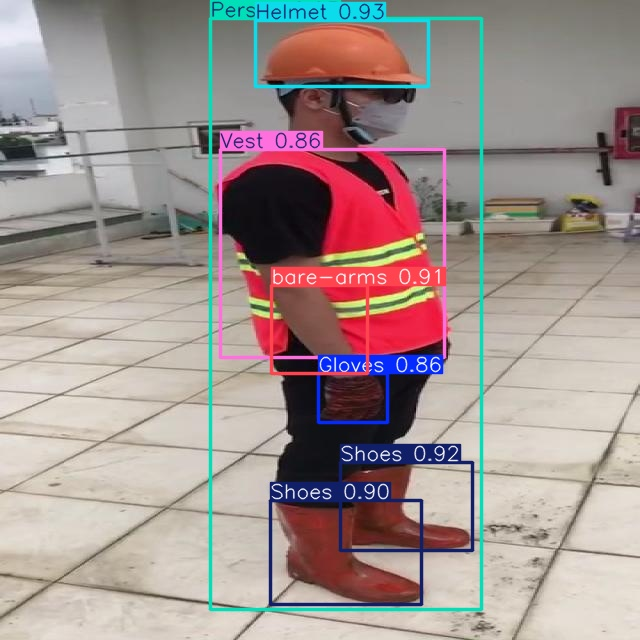

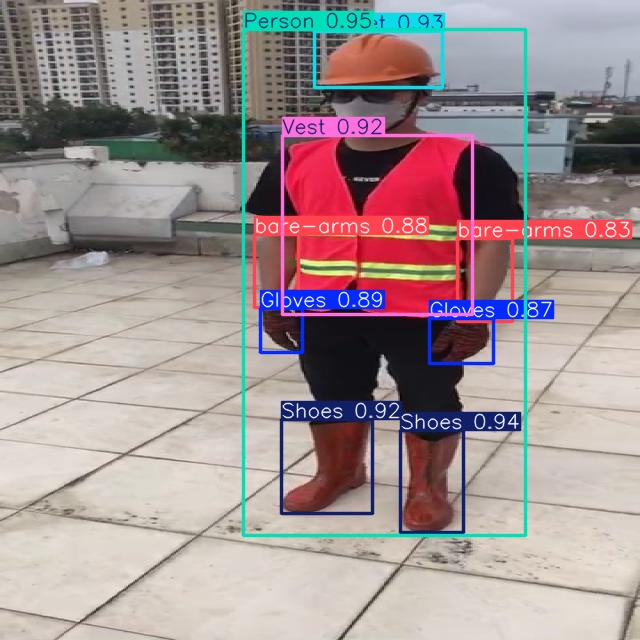

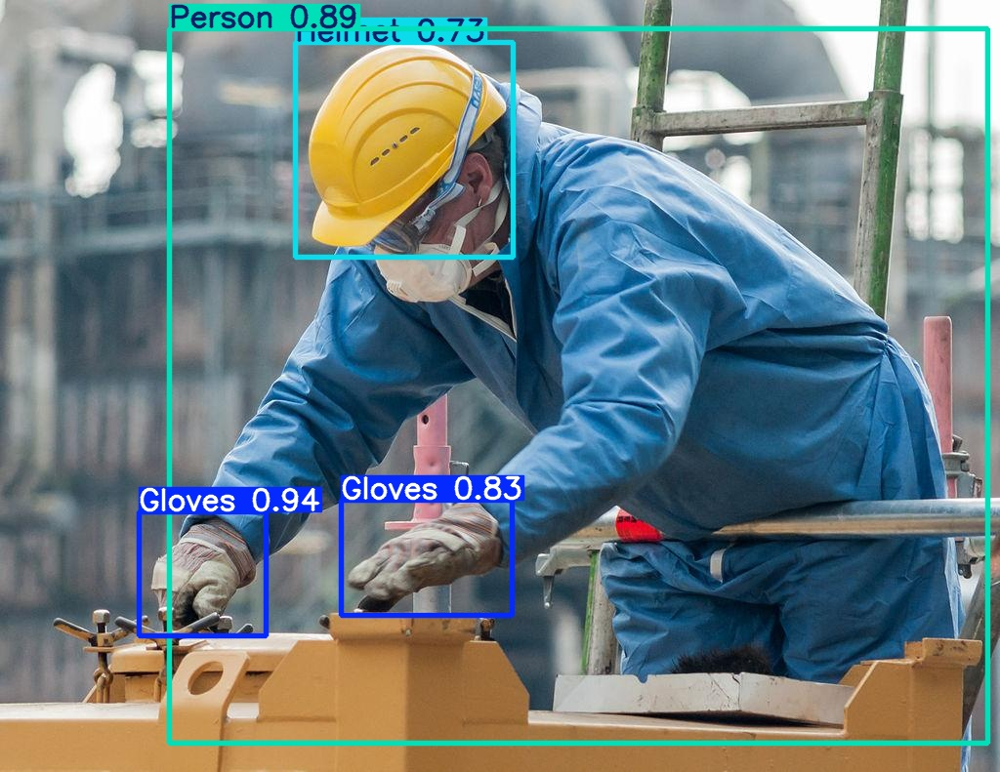

In [ ]:
latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

### Single image Inference

In [22]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source=helmet.jpg save=True

Ultralytics 8.3.160 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/cfg/__init__.py", line 983, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py", line 555, in predict
    return self.predictor.predict_cli(source=source) if is_cli else self.predictor(source=source, stream=stream)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/predictor.py", line 247, in predict_cli
    for _ in gen:  # sourcery skip: remove-empty-nested-block, noqa
  File "/usr/local/lib/python3.11/dist-packages/to

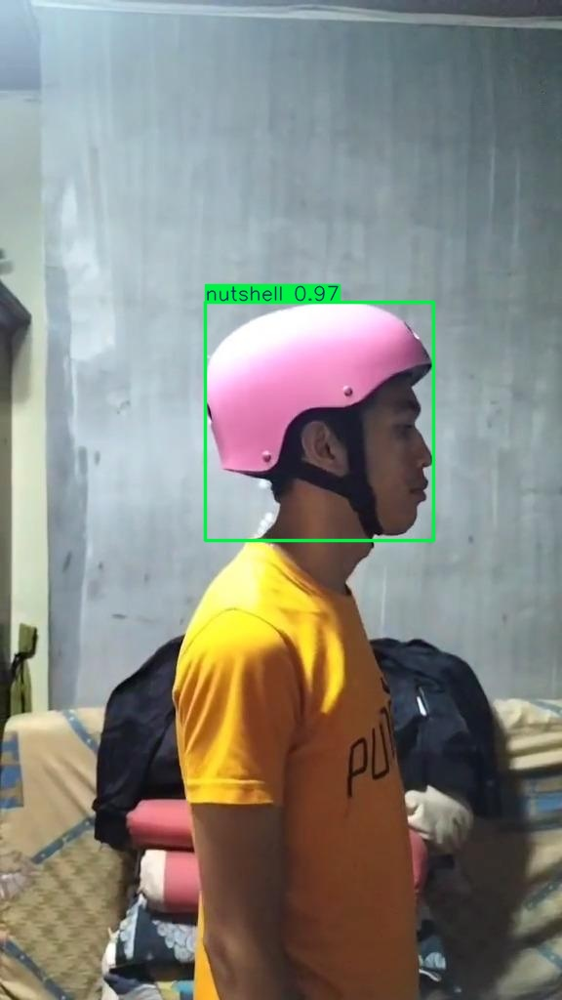

In [ ]:
Image("/content/runs/detect/predict2/helmet.jpg", width=600)

# 7) Video Inference

In [29]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source="test_video_fact.mp4" save=True

Ultralytics 8.3.160 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/241) /content/test_video_fact.mp4: 384x640 (no detections), 45.4ms
video 1/1 (frame 2/241) /content/test_video_fact.mp4: 384x640 (no detections), 12.4ms
video 1/1 (frame 3/241) /content/test_video_fact.mp4: 384x640 1 Helmet, 1 Person, 11.9ms
video 1/1 (frame 4/241) /content/test_video_fact.mp4: 384x640 1 Helmet, 1 Person, 12.0ms
video 1/1 (frame 5/241) /content/test_video_fact.mp4: 384x640 1 Helmet, 1 Person, 14.1ms
video 1/1 (frame 6/241) /content/test_video_fact.mp4: 384x640 1 Helmet, 1 Person, 12.5ms
video 1/1 (frame 7/241) /content/test_video_fact.mp4: 384x640 1 Helmet, 1 Person, 12.3ms
video 1/1 (frame 8/241) /content/test_video_fact.mp4: 384x640 1 Helmet, 1 Person, 14.1ms
video 1/1 (frame 9/241) /content/test_video_fact.mp4: 384x640 1 Helmet, 1 Person, 11.1ms
video 1/1 (frame 10/241) /content/test

In [31]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict4/test_video_fact.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)